# ***Computer Vision*** - Machine Learning Model for Supermarket Clients Age Detection

## Project Description

The chain supermarket includes a computer detection system for processing customer pictures taken while making a purchase at a cashier desk. Photo fixation in the checkout area will help determine the age of customers in order to:
- analyze purchases and offer products that are of interest to buyers of this age group;
- control the conscientiousness of cashiers when selling alcohol.


## Project Goal
To solve a regression problem by constructing a machine learning model, which detects an age of a customer.

## Data
The dataset of pictures and age is given in the .png and .csv formats.
Данные взяты с сайта [ChaLearn Looking at People](http://chalearnlap.cvc.uab.es/dataset/26/description/).


## Project Methodology
1. Exploratory Data Analysis of the dataset: 1) check size of the dataset; 2) build a distribution graph; 3) print out the images.
2. Data proprecessing for modelling.
3. Tuning and testing a neural network, preferably **ResNet50** with an activation function **'ReLU'**, because the ReLU function does not change positive forecasts of the network, and all negative ones lead to zero. Numbers less than 0 cannot be.
4. **Quality metric is MAE < 6.5** or MSE.
5. For data extraction please use ImageDataGenerator —flow_from_dataframe(dataframe, directory, ...)

## References
- [Image Data Processing](https://keras.io/api/preprocessing/image/)


In [85]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import cv2
import os
# https://pillow.readthedocs.io/en/stable/handbook/tutorial.html

from tensorflow.keras.utils import load_img
from tensorflow.keras import Sequential
from tqdm.notebook import tqdm
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.applications.resnet import ResNet50
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import Conv2D, Flatten, Dense, AvgPool2D, MaxPooling2D

import warnings
warnings.simplefilter("ignore", category=RuntimeWarning)
pd.options.mode.chained_assignment = None;

## 1 Exploratory Data Analysis

### 1.1 Load the data

In [2]:
# train labels averaged
gt_avg_train = pd.read_csv('/Users/yuliabezginova/PycharmProjects/00_files-for_NLP/appa-real-release/appa-real-release/gt_avg_train.csv')
gt_avg_train.shape

(4113, 5)

In [5]:
# train labels
gt_train = pd.read_csv('/Users/yuliabezginova/PycharmProjects/00_files-for_NLP/appa-real-release/appa-real-release/gt_train.csv')
gt_train.shape

(133935, 5)

In [6]:
# validation labels averaged
gt_avg_valid = pd.read_csv('/Users/yuliabezginova/PycharmProjects/00_files-for_NLP/appa-real-release/appa-real-release/gt_avg_valid.csv')
gt_avg_valid.shape

(1500, 5)

In [7]:
# validation labels
gt_valid = pd.read_csv('/Users/yuliabezginova/PycharmProjects/00_files-for_NLP/appa-real-release/appa-real-release/gt_valid.csv')
gt_valid.shape

(51257, 5)

In [8]:
# test labels averaged
gt_avg_test = pd.read_csv('/Users/yuliabezginova/PycharmProjects/00_files-for_NLP/appa-real-release/appa-real-release/gt_avg_test.csv')
gt_avg_test.shape

(1978, 5)

In [9]:
# test labels
gt_test = pd.read_csv('/Users/yuliabezginova/PycharmProjects/00_files-for_NLP/appa-real-release/appa-real-release/gt_test.csv')
gt_test.shape

(75464, 5)

In [11]:
cv2.imread('/Users/yuliabezginova/PycharmProjects/00_files-for_NLP/appa-real-release/appa-real-release/train/000000.jpg_face.jpg')

array([[[ 36,  71, 127],
        [ 75, 112, 168],
        [ 77, 115, 169],
        ...,
        [ 83, 103, 150],
        [ 92, 110, 157],
        [ 93, 112, 157]],

       [[ 44,  77, 133],
        [ 71, 106, 162],
        [ 73, 111, 165],
        ...,
        [103, 123, 171],
        [103, 124, 169],
        [103, 124, 169]],

       [[ 31,  61, 118],
        [ 40,  73, 129],
        [ 41,  77, 131],
        ...,
        [116, 136, 184],
        [112, 135, 180],
        [112, 136, 178]],

       ...,

       [[ 21,  66, 110],
        [ 22,  69, 113],
        [ 26,  73, 117],
        ...,
        [ 70, 155, 211],
        [ 57, 140, 192],
        [ 57, 140, 192]],

       [[ 30,  73, 116],
        [ 15,  60, 103],
        [  9,  54,  97],
        ...,
        [ 58, 142, 200],
        [ 54, 135, 192],
        [ 63, 143, 198]],

       [[ 28,  72, 113],
        [ 14,  58,  99],
        [  7,  53,  94],
        ...,
        [ 51, 135, 193],
        [ 54, 134, 193],
        [ 63, 142, 199]]

In [ ]:
# cv2.imshow('Open image', image_ex)
# cv2.waitKey()

### 1.2 Target variables overview 

In [26]:
gt_train.head()

,file_name,real_age,apparent_age,worker_age,worker_gender
0,000000.jpg,4,5,36,male
1,000000.jpg,4,4,38,female
2,000000.jpg,4,7,52,female
3,000000.jpg,4,5,50,male
4,000000.jpg,4,4,52,female


In [27]:
gt_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 133935 entries, 0 to 133934
Data columns (total 5 columns):
 #   Column         Non-Null Count   Dtype 
---  ------         --------------   ----- 
 0   file_name      133935 non-null  object
 1   real_age       133935 non-null  int64 
 2   apparent_age   133935 non-null  int64 
 3   worker_age     133935 non-null  int64 
 4   worker_gender  25374 non-null   object
dtypes: int64(3), object(2)
memory usage: 5.1+ MB


In [28]:
gt_train['real_age'].describe().T

count    133935.000000
mean         29.131295
std          15.623277
min           1.000000
25%          19.000000
50%          27.000000
75%          38.000000
max         100.000000
Name: real_age, dtype: float64

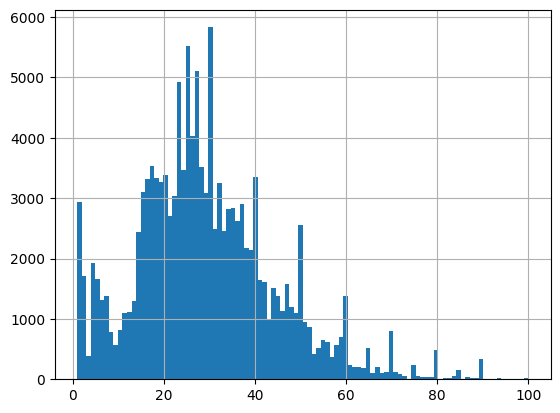

In [29]:
gt_train['real_age'].hist(bins=100);

In [30]:
gt_train['real_age'].isna().sum()

0

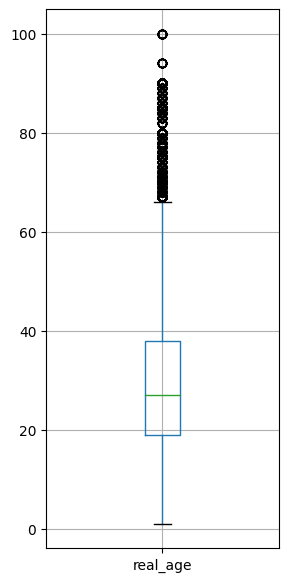

In [31]:
gt_train.boxplot(column='real_age', figsize=(3,7));
plt.show()

In [39]:
gt_train_no_outliers = gt_train.drop(gt_train[gt_train['real_age'] > 65].index)
print(gt_train_no_outliers['real_age'].unique())

[ 4 18 50 17 27 24 43 26 39 51  2  1  6  5 40 16 29 35 25 30 65 13 28 31
 10 34 15  8 20 19 42 23 58 44  7 21 14 48 45 37 22 59 53  9 41 32 60 38
 54 49 36 11 52 33 47 46 55 63 12 56  3 64 62 57 61]


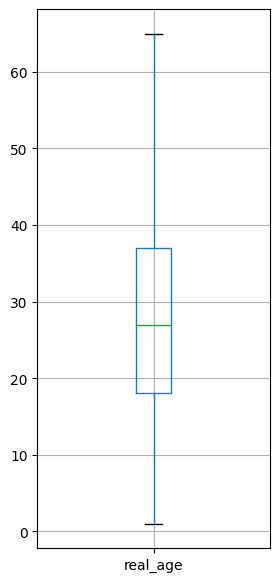

In [40]:
gt_train_no_outliers.boxplot(column='real_age', figsize=(3,7));
plt.show()

In [41]:
gt_train['real_age'].duplicated().sum()

133844

### 1.3 Creating image data generators for train, validation and test data

From the images in the folders, class ImageDataGenerator forms batches with images and class labels.

In [18]:
datagen = ImageDataGenerator(validation_split=0.25,
                             rescale=1./255)

Чтобы загрузчик извлёк данные из папки, вызовите функцию flow_from_directory() (англ. «поток из директории»):

In [67]:
train_datagen_flow = datagen.flow_from_directory(
'/Users/yuliabezginova/PycharmProjects/00_files-for_NLP/appa-real-release/appa-real-release',
    target_size=(150, 150),
    batch_size=30,
    class_mode='sparse',
    subset='training',
    seed=12345
)

Found 11387 images belonging to 3 classes.


In [68]:
# англ. индексы классов
print(train_datagen_flow.class_indices)

{'test': 0, 'train': 1, 'valid': 2}


In [59]:
# the first image
print(next(train_datagen_flow)[0][0])

[[[1.         1.         1.        ]
  [1.         1.         1.        ]
  [1.         1.         1.        ]
  ...
  [0.427451   0.48627454 0.        ]
  [0.43921572 0.47058827 0.00392157]
  [0.52156866 0.52156866 0.08235294]]

 [[1.         1.         1.        ]
  [1.         1.         1.        ]
  [1.         1.         1.        ]
  ...
  [0.4156863  0.4784314  0.09019608]
  [0.37647063 0.43137258 0.0509804 ]
  [0.42352945 0.45882356 0.10196079]]

 [[1.         1.         1.        ]
  [1.         1.         1.        ]
  [1.         1.         1.        ]
  ...
  [0.43529415 0.5058824  0.1764706 ]
  [0.43137258 0.5176471  0.19215688]
  [0.3647059  0.454902   0.13333334]]

 ...

 [[1.         0.9294118  0.7372549 ]
  [1.         0.92549026 0.7411765 ]
  [1.         0.9176471  0.7490196 ]
  ...
  [0.10196079 0.13725491 0.        ]
  [0.16078432 0.20000002 0.        ]
  [0.21960786 0.21960786 0.00784314]]

 [[0.95294124 0.8980393  0.7607844 ]
  [0.97647065 0.89019614 0.6627451 ]


In [60]:
val_datagen_flow = datagen.flow_from_directory(
'/Users/yuliabezginova/PycharmProjects/00_files-for_NLP/appa-real-release/appa-real-release',
    target_size=(150, 150),
    batch_size=30,
    class_mode='sparse',
    subset='validation',
    seed=12345
)

Found 3795 images belonging to 1 classes.


In [61]:
# англ. индексы классов
print(val_datagen_flow.class_indices)

{'appa-real-release': 0}


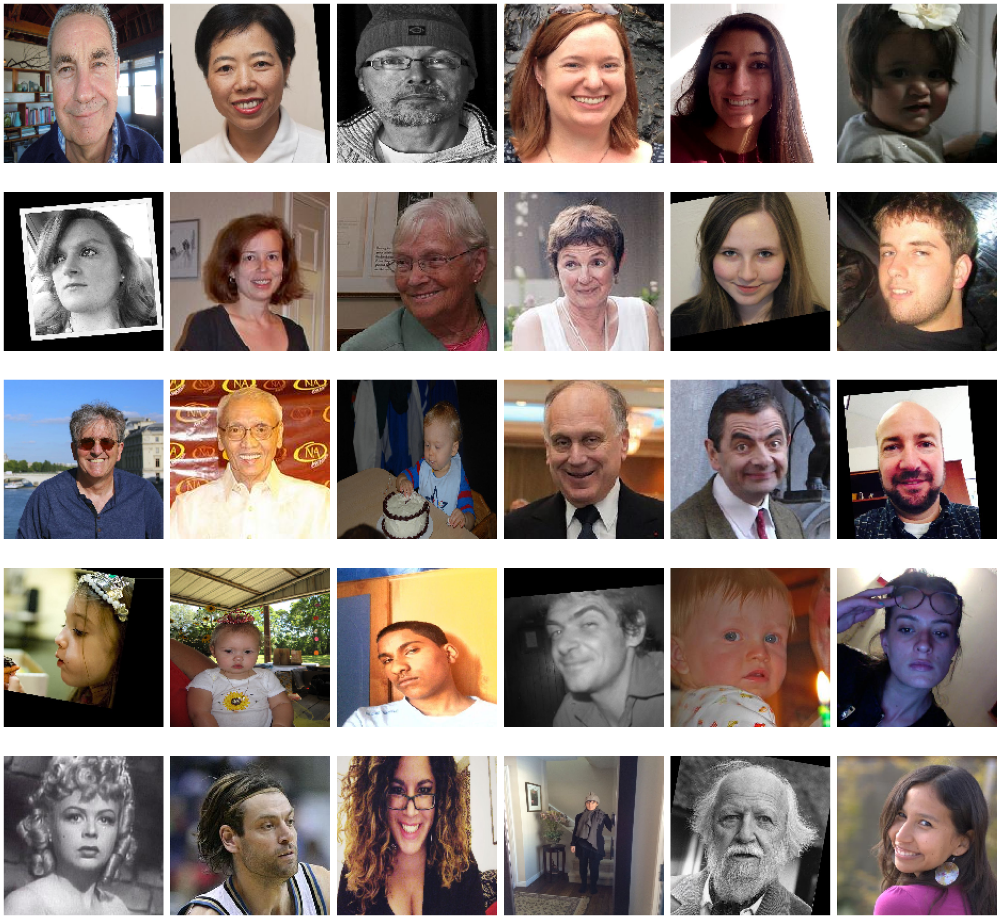

In [62]:
features, target = next(train_datagen_flow)

# to display grid of images
fig = plt.figure(figsize=(28, 28))
for i in range(30):
    fig.add_subplot(5, 6, i+1)
    plt.imshow(features[i])
    plt.xticks([])
    plt.yticks([])
    plt.tight_layout()
    plt.axis('off')

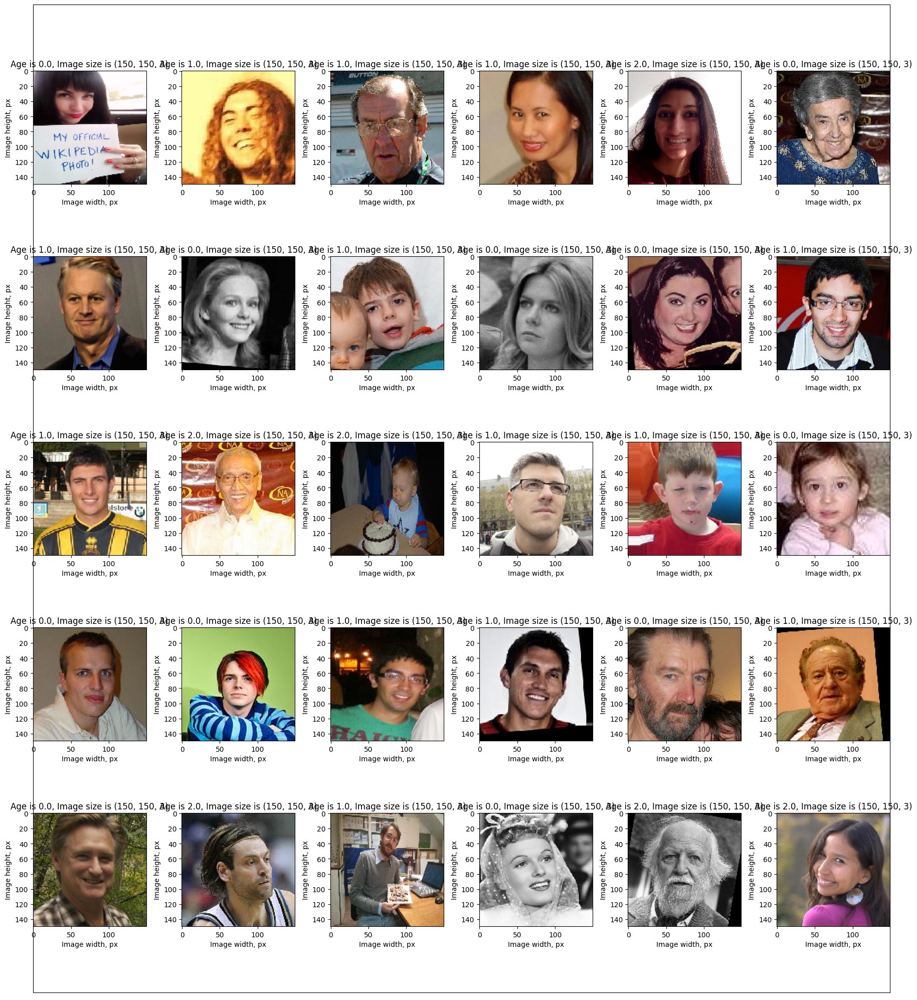

In [82]:
features, target = next(train_datagen_flow)

# выводим 30 изображений

fig = plt.figure(figsize=(18, 20))
# plt.title('Photo Examples', {'fontsize': 20, 'fontweight' : 10, 'verticalalignment': 'baseline'})
plt.xticks([])
plt.yticks([])
plt.tight_layout()
for i in range(30):
    fig.add_subplot(5, 6, i+1)
    plt.imshow(features[i])
    plt.tight_layout() 
    plt.title('Age is {}, Image size is {}'.format(target[i], features[i].shape), loc='center')
    plt.xlabel('Image width, px')
    plt.ylabel('Image height, px')

In [70]:
MAIN_DIR = '/Users/yuliabezginova/PycharmProjects/00_files-for_NLP/appa-real-release/appa-real-release/train'

In [77]:
f_list = os.listdir(MAIN_DIR)
f_num = len(f_list)
print('Number of images:', f_num)
print(f_list[0])

Number of images: 12339
003301.jpg


In [83]:
print(features.shape)

(30, 150, 150, 3)


# 2 Training the model

In [86]:
def load_train(path):
    labels = pd.read_csv(path + 'labels.csv')
    train_datagen = ImageDataGenerator(validation_split=0.25, horizontal_flip=True, rescale=1./255)
    train_gen_flow = train_datagen.flow_from_dataframe(
        dataframe=labels,
        directory=path + 'final_files/',
        x_col='file_name',
        y_col='real_age',
        target_size=(224, 224),
        batch_size=16,
        class_mode='raw',
        subset='training',
        seed=12345)

    return train_gen_flow


def load_test(path):
    labels = pd.read_csv(path + 'labels.csv')
    test_datagen = ImageDataGenerator(validation_split=0.25, rescale=1./255)
    test_gen_flow = test_datagen.flow_from_dataframe(
        dataframe=labels,
        directory=path + 'final_files/',
        x_col='file_name',
        y_col='real_age',
        target_size=(224, 224),
        batch_size=16,
        class_mode='raw',
        subset='validation',
        seed=12345)

    return test_gen_flow



def create_model(input_shape):

    backbone = ResNet50(input_shape=input_shape,
                    weights='imagenet',
                    include_top=False)
    model = Sequential()
    model.add(backbone)
    model.add(GlobalAveragePooling2D())
    model.add(Dense(1, activation='relu'))

    optimizer = Adam(lr=0.0001)
    model.compile(optimizer=optimizer, loss='mean_squared_error',
                  metrics=['mae'])

    return model


def train_model(model, train_data, test_data, batch_size=None, epochs=5,
                steps_per_epoch=None, validation_steps=None):

    if steps_per_epoch is None:
        steps_per_epoch = len(train_data)
    if validation_steps is None:
        validation_steps = len(test_data)

    model.fit(train_data,
              validation_data=test_data,
              batch_size=batch_size,
              epochs=epochs,
              steps_per_epoch=steps_per_epoch,
              validation_steps=validation_steps,
              verbose=2)

    return model